Precision del modelo:  0.9710666666666666


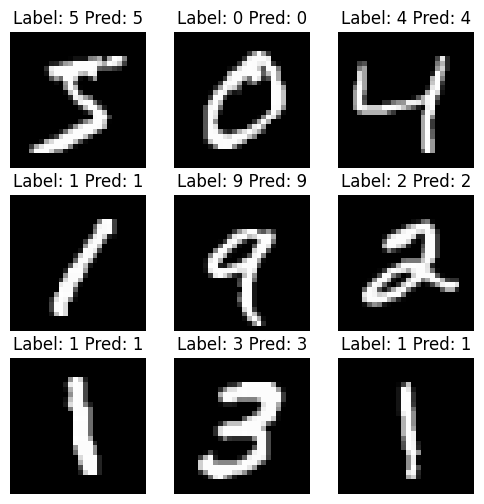

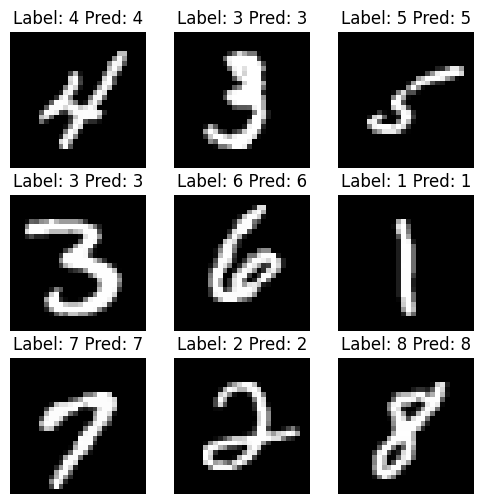

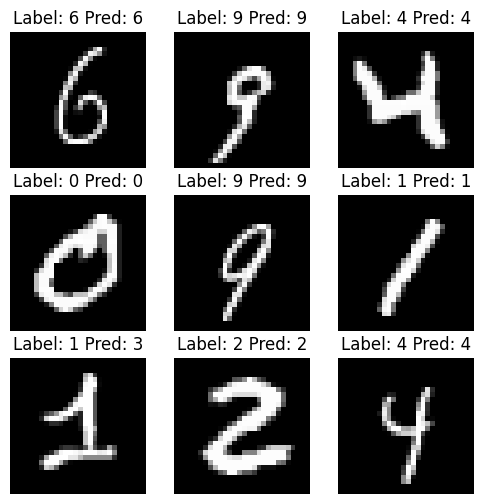

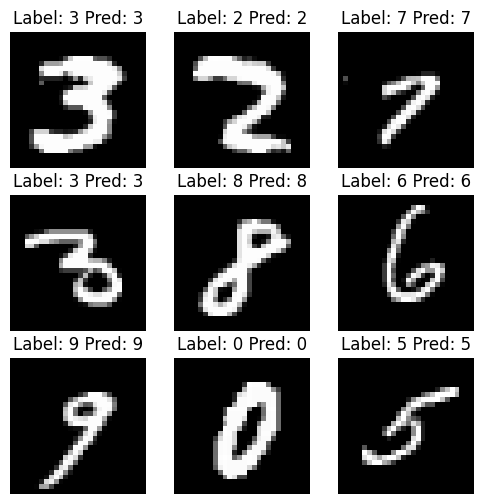

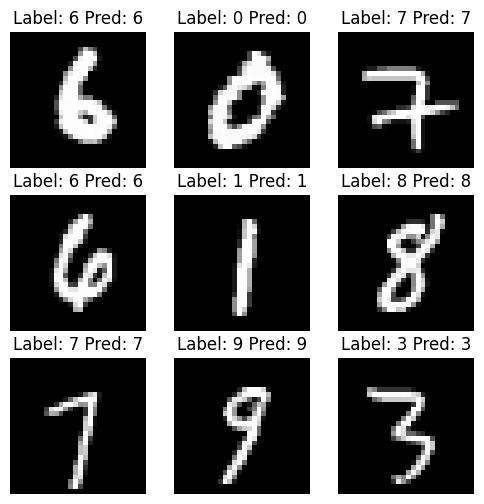

...

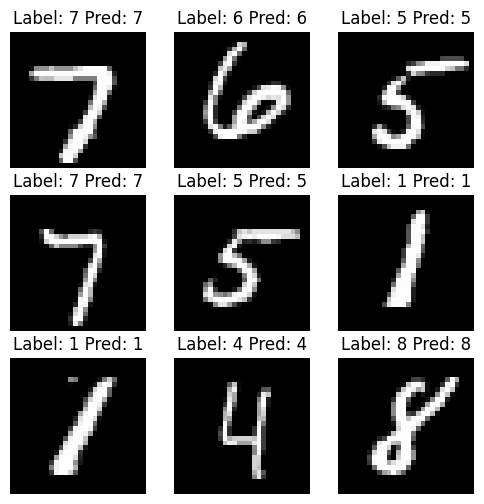

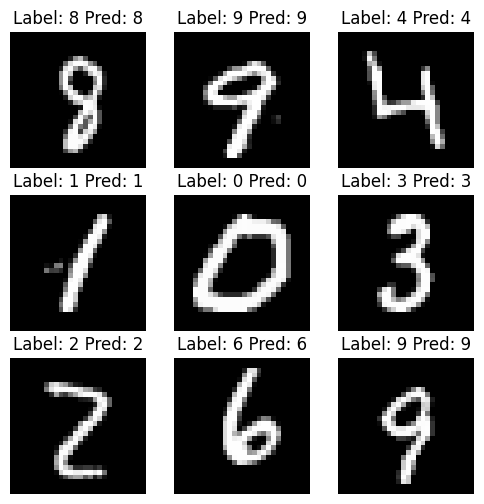

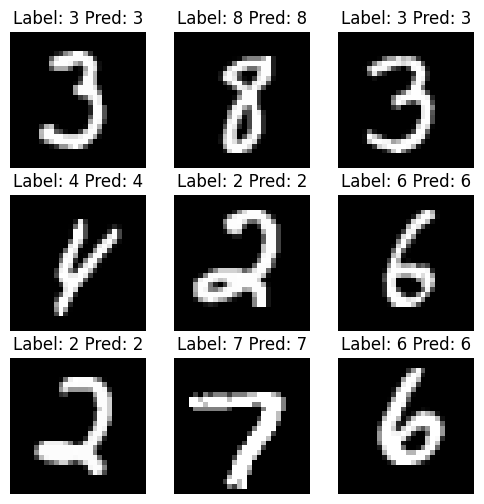

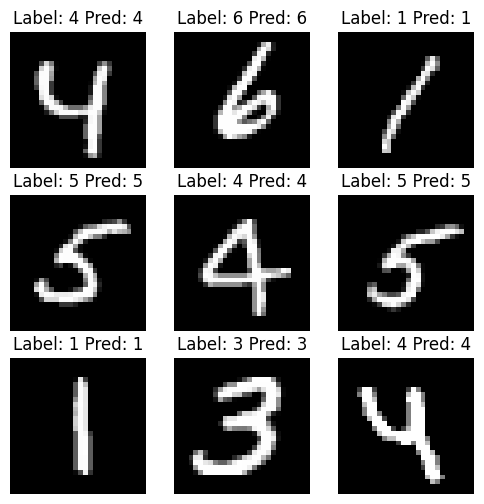

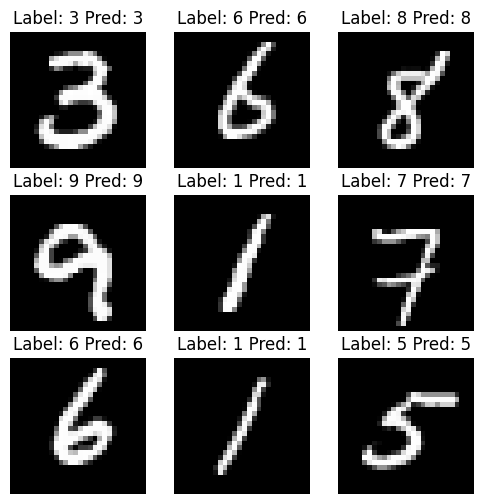

In [ ]:
import DnnLib as Dn
import numpy as np 
import json 
import matplotlib.pyplot as plt

data = np.load("mnist_train.npz")
images = data["images"]
labels = data["labels"]

with open("mnist_mlp_pretty.json") as f:
  file = json.load(f)
    
datos = (images / file["preprocess"]["scale"]).reshape(images.shape[0], -1)
layer1 = Dn.DenseLayer(784, file["layers"][0]["units"], Dn.ActivationType.RELU)
layer1.weights = np.array(file["layers"][0]["W"]).T
layer1.bias = np.array(file["layers"][0]["b"])

layer2 = Dn.DenseLayer(file["layers"][0]["units"], file["layers"][1]["units"] , Dn.ActivationType.SOFTMAX)
layer2.weights = np.array(file["layers"][1]["W"]).T
layer2.bias = np.array(file["layers"][1]["b"])


Output = layer1.forward(datos)
Resultado = layer2.forward(Output)

predictions = np.argmax(Resultado, axis=1)
accuracy = np.mean(predictions== labels)
print("Precision del modelo: ",accuracy)
plt.figure(figsize=(6,6))
for i in range(len(images)):
    if i % 9 == 0 and i != 0:
        plt.show()
        plt.figure(figsize=(6,6))
    
    plt.subplot(3, 3, (i % 9) + 1)
    plt.imshow(images[i], cmap="gray")
    plt.title(f"Label: {labels[i]} Pred: {predictions[i]}")
    plt.axis("off")
plt.show()
    

